In [1]:
import metpy
from metpy.plots import add_timestamp
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from datetime import datetime
from siphon.catalog import TDSCatalog
from matplotlib.colors import Normalize
%matplotlib inline

In [12]:
url = "https://thredds-jumbo.unidata.ucar.edu/thredds/catalog/satellite/goes/east/grb/ABI/CONUS/Channel02/current/catalog.xml"
sat_catalog = TDSCatalog(url)
sat_file_name = sat_catalog.datasets[0]
sat_data = sat_file_name.remote_access(use_xarray=True)
sat_data


<xarray.Dataset>
Dimensions:                                           (y: 6000, x: 10000, number_of_time_bounds: 2, number_of_image_bounds: 2, band: 1, num_star_looks: 24)
Coordinates:
  * y                                                 (y) float32 0.1282 ... ...
  * x                                                 (x) float32 -0.1014 ......
    t                                                 datetime64[ns] ...
    y_image                                           float32 ...
    x_image                                           float32 ...
    band_id                                           (band) int8 ...
    band_wavelength                                   (band) float32 ...
    t_star_look                                       (num_star_looks) datetime64[ns] ...
    band_wavelength_star_look                         (num_star_looks) float32 ...
Dimensions without coordinates: number_of_time_bounds, number_of_image_bounds, band, num_star_looks
Data variables: (12/37)
    Rad                                               (y, x) float32 ...
    DQF                                               (y, x) float32 ...
    time_bounds                                       (number_of_time_bounds) datetime64[ns] ...
    goes_imager_projection                            int32 ...
    y_image_bounds                                    (number_of_image_bounds) float32 ...
    x_image_bounds                                    (number_of_image_bounds) float32 ...
    ...                                                ...
    algorithm_dynamic_input_data_container            int32 ...
    processing_parm_version_container                 int32 ...
    algorithm_product_version_container               int32 ...
    star_id                                           (num_star_looks) float32 ...
    channel_integration_time                          float64 ...
    channel_gain_field                                float64 ...
Attributes: (12/34)
    _NCProperties:                         version=1|netcdflibversion=4.4.1.1...
    naming_authority:                      gov.nesdis.noaa
    Conventions:                           CF-1.7
    Metadata_Conventions:                  Unidata Dataset Discovery v1.0
    standard_name_vocabulary:              CF Standard Name Table (v35, 20 Ju...
    institution:                           DOC/NOAA/NESDIS > U.S. Department ...
    ...                                    ...
    time_coverage_end:                     2022-09-11T03:03:54.4Z
    LUT_Filenames:                         SpaceLookParams(FM1A_CDRL79RevP_PR...
    cspp_geo_grb_version:                  CSPP Geo GRB v1.0.25
    cspp_geo_grb_production_host:          ingest.unidata.ucar.edu
    history:                               2022-09-11, 03:04:02, ldm, /usr/lo...
    cspp_geo_grb_reconstruction_end_time:  2022-09-11 03:04:02.140958

In [13]:
data = sat_data.metpy.parse_cf('Rad')
proj = data.metpy.cartopy_crs

In [14]:
x = data['x']
y = data['y']

In [32]:
color_range = Normalize(vmin=-25, vmax=data.max())
color_map = 'binary_r'

/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


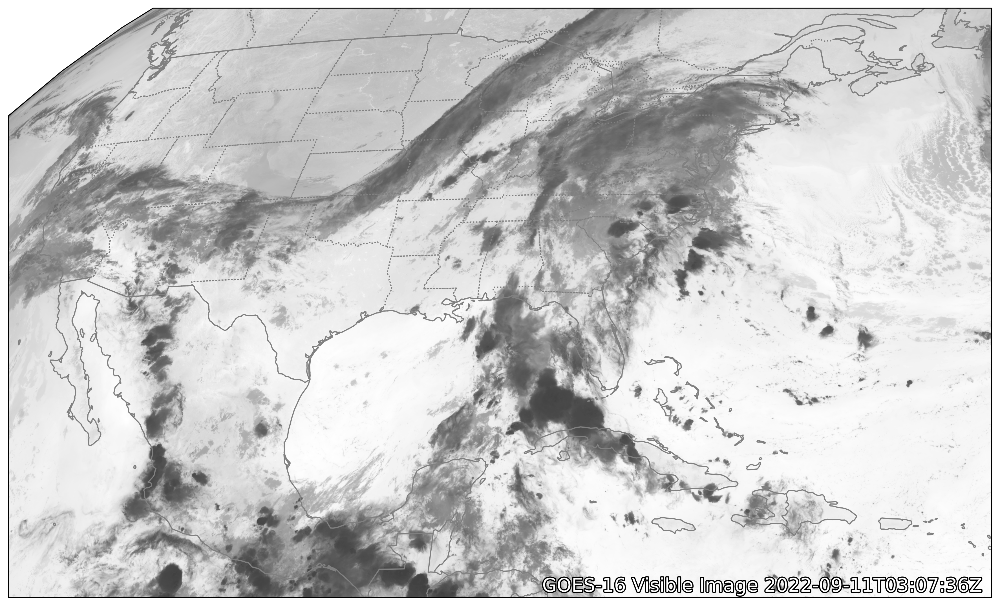

In [33]:
fig = plt.figure(figsize=(15, 15), dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=proj)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=1, edgecolor = 'grey')
ax.add_feature(cfeature.STATES.with_scale('50m'), linestyle=':',linewidth = 1, edgecolor='grey')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=1, edgecolor='grey')
im = ax.imshow(data, extent=(x.min(), x.max(), y.min(), y.max()), origin='upper', cmap=color_map, norm=color_range)
start_time = datetime.strptime(str(data.t.values)[:-3], 
                               '%Y-%m-%dT%H:%M:%S.%f') 
add_timestamp(ax, time=start_time, pretext='GOES-16 Visible Image ',
              high_contrast=True, fontsize=16, y=0.01)
plt.show()

In [23]:
url = "https://thredds-jumbo.unidata.ucar.edu/thredds/catalog/satellite/goes/east/grb/ABI/CONUS/Channel13/current/catalog.html"
sat_catalog = TDSCatalog(url)
sat_file_name = sat_catalog.datasets[0]
sat_data = sat_file_name.remote_access(use_xarray=True)
data = sat_data.metpy.parse_cf('Rad')
proj = data.metpy.cartopy_crs
x = data['x']
y = data['y']
color_range = Normalize(vmin=10, vmax=150)

/opt/tljh/user/lib/python3.7/site-packages/siphon/catalog.py:293: UserWarning: URL https://thredds-jumbo.unidata.ucar.edu/thredds/catalog/satellite/goes/east/grb/ABI/CONUS/Channel13/current/catalog.html returned HTML. Changing to: https://thredds-jumbo.unidata.ucar.edu/thredds/catalog/satellite/goes/east/grb/ABI/CONUS/Channel13/current/catalog.xml
  new_url))


In [26]:
color_map = 'pink_r'

/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


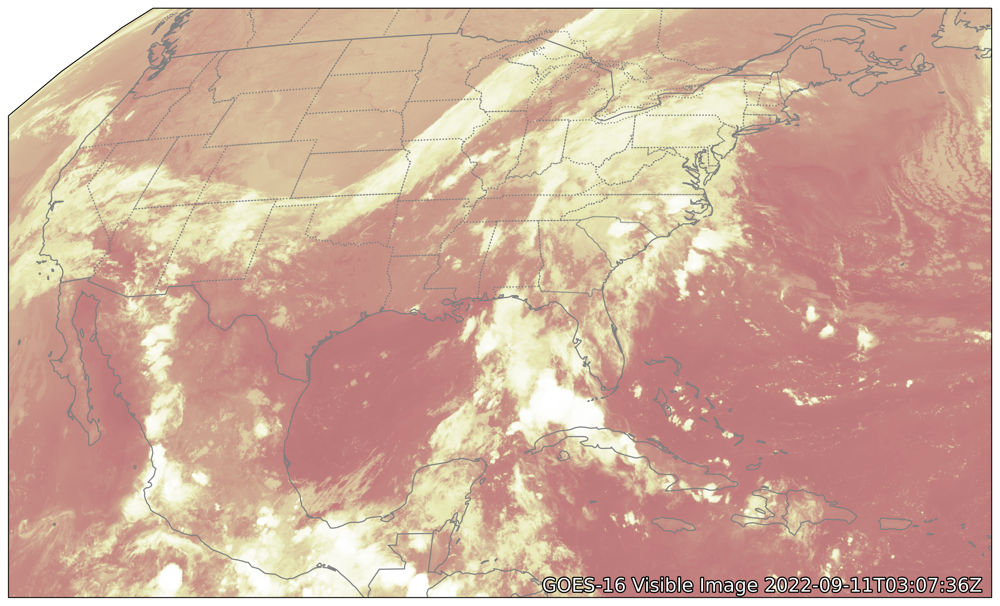

In [27]:
fig = plt.figure(figsize=(15, 15), dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=proj)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=1, edgecolor = 'grey')
ax.add_feature(cfeature.STATES.with_scale('50m'), linestyle=':',linewidth = 1, edgecolor='grey')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=1, edgecolor='grey')
im = ax.imshow(data, extent=(x.min(), x.max(), y.min(), y.max()), origin='upper', cmap=color_map, norm=color_range)
start_time = datetime.strptime(str(data.t.values)[:-3], 
                               '%Y-%m-%dT%H:%M:%S.%f') 
add_timestamp(ax, time=start_time, pretext='GOES-16 Visible Image ',
              high_contrast=True, fontsize=16, y=0.01)
plt.show()